In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import butter, filtfilt

In [ ]:
from pandas.plotting import autocorrelation_plot
import pywt  # Step 4: Discrete Wavelet Transform library
from statsmodels.tsa.ar_model import AutoReg # For Autoregression

#***Pre-Processing***

In [ ]:
data_path = '/content/'
classes = ['yukari', 'asagi', 'sag', 'sol', 'kirp'] #the only movment files
fs = 176

class_mapping = {
    'Yukari': 'Up',
    'Asagi': 'Down',
    'Sag': 'Right',
    'Sol': 'Left',
    'Kirp': 'Blink'
}


def remove_dc(signal):
    return signal - np.mean(signal)

def butter_bandpass_filter(data, lowcut=0.5, highcut=20.0, fs=176, order=4):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, data)

def preprocess_signal(signal):
    signal = remove_dc(signal)
    filtered = butter_bandpass_filter(signal)
    normalized = (filtered - np.mean(filtered)) / (np.std(filtered) + 1e-6)
    return normalized



X = []
y = []

for label_idx, movement in enumerate(classes):
    files_v = sorted([f for f in os.listdir(data_path) if f.startswith(f"{movement}") and f.endswith("v.txt")])
    files_h = sorted([f for f in os.listdir(data_path) if f.startswith(f"{movement}") and f.endswith("h.txt")])

    # make sure pairing is correct
    for v_file, h_file in zip(files_v, files_h):
        try:
            v = np.loadtxt(os.path.join(data_path, v_file))
            h = np.loadtxt(os.path.join(data_path, h_file))

            # preprocessing
            v_clean = preprocess_signal(v)
            h_clean = preprocess_signal(h)

            # combine channels
            combined_signal = np.concatenate([v_clean, h_clean])

            X.append(combined_signal)
            y.append(label_idx)

        except:
            continue

In [ ]:
X = np.array(X)
y = np.array(y)

***plots***

Total files: 278


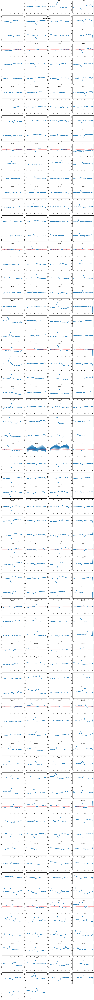

In [ ]:
files = sorted([f for f in os.listdir(data_path) if f.endswith('.txt')])

print(f"Total files: {len(files)}")


cols = 4
rows = (len(files) // cols) + 1

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, file in enumerate(files):
    try:
        data = np.loadtxt(os.path.join(data_path, file))
        axes[i].plot(data)
        axes[i].set_title(file, fontsize=8)
        axes[i].set_ylim(50, 210)
        axes[i].axhline(y=135, color='r', linestyle='--', alpha=0.3)
    except:
        axes[i].set_visible(False)

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("RAW SIGNALS", fontsize=16)
plt.tight_layout()
plt.show()

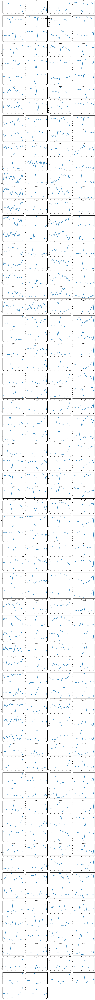

In [ ]:
fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, file in enumerate(files):
    try:
        data = np.loadtxt(os.path.join(data_path, file))
        clean = preprocess_signal(data)

        axes[i].plot(clean)
        axes[i].set_title(file, fontsize=8)
    except:
        axes[i].set_visible(False)

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("PREPROCESSED SIGNALS", fontsize=16)
plt.tight_layout()
plt.show()


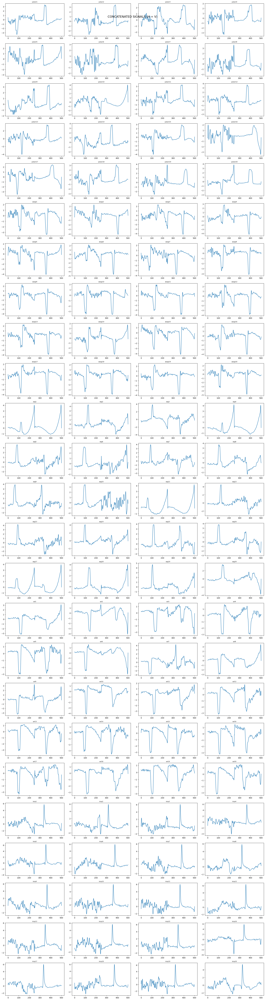

In [ ]:
combined_signals = []
titles = []

for movement in classes:
    for trial in range(1, 21):
        try:
            v = np.loadtxt(os.path.join(data_path, f"{movement}{trial}v.txt"))
            h = np.loadtxt(os.path.join(data_path, f"{movement}{trial}h.txt"))

            v_clean = preprocess_signal(v)
            h_clean = preprocess_signal(h)

            combined = np.concatenate([v_clean, h_clean])

            combined_signals.append(combined)
            titles.append(f"{movement}{trial}")

        except:
            continue

# Plot combined
cols = 4
rows = (len(combined_signals) // cols) + 1

fig, axes = plt.subplots(rows, cols, figsize=(20, rows * 3))
axes = axes.flatten()

for i, signal in enumerate(combined_signals):
    axes[i].plot(signal)
    axes[i].set_title(titles[i], fontsize=8)

for j in range(i+1, len(axes)):
    axes[j].set_visible(False)

plt.suptitle("CONCATENATED SIGNALS (H + V)", fontsize=16)
plt.tight_layout()
plt.show()

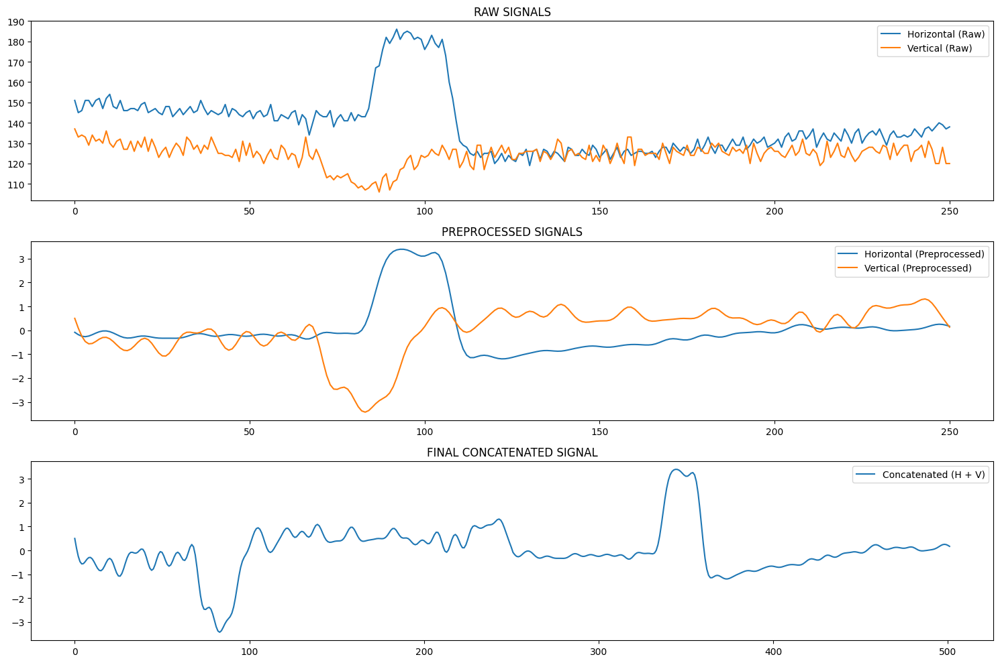

In [ ]:
movement = 'yukari'
trial = 1
data_path = '/content/'


v_raw = np.loadtxt(os.path.join(data_path, f"{movement}{trial}v.txt"))
h_raw = np.loadtxt(os.path.join(data_path, f"{movement}{trial}h.txt"))

# Preprocess
v_clean = preprocess_signal(v_raw)
h_clean = preprocess_signal(h_raw)

# Concatenate
combined = np.concatenate([v_clean, h_clean])


plt.figure(figsize=(15, 10))

#RAW SIGNALS
plt.subplot(3,1,1)
plt.plot(h_raw, label='Horizontal (Raw)')
plt.plot(v_raw, label='Vertical (Raw)')
plt.title("RAW SIGNALS")
plt.legend()

#PREPROCESSED SIGNALS
plt.subplot(3,1,2)
plt.plot(h_clean, label='Horizontal (Preprocessed)')
plt.plot(v_clean, label='Vertical (Preprocessed)')
plt.title("PREPROCESSED SIGNALS")
plt.legend()

#CONCATENATED SIGNAL
plt.subplot(3,1,3)
plt.plot(combined, label='Concatenated (H + V)')
plt.title("FINAL CONCATENATED SIGNAL")
plt.legend()

plt.tight_layout()
plt.show()

# ***Feature extraction***

In [ ]:
normalized = {v: [] for v in class_mapping.values()}

reverse_mapping = {
    0: 'Up',
    1: 'Down',
    2: 'Right',
    3: 'Left',
    4: 'Blink'
}

for i, signal in enumerate(X):
    cls_name = reverse_mapping[y[i]]   # SAFE DIRECT MAPPING
    normalized[cls_name].append(signal)

In [ ]:
for cls, signals in normalized.items():
    print(f"{cls}: {len(signals)} signals")

Up: 20 signals
Down: 20 signals
Right: 20 signals
Left: 20 signals
Blink: 20 signals



Plotting FFT to analyze frequency distribution...


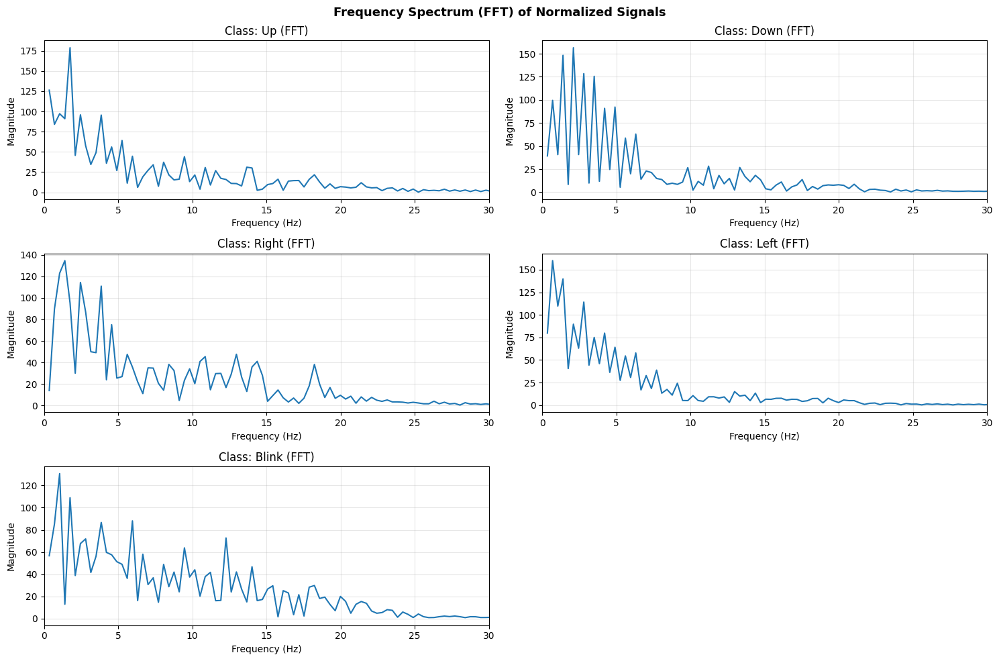

In [ ]:
def plot_fft(signals_dict, fs=fs):
    """Computes and plots the FFT for the first signal of each class to analyze frequency content."""
    plt.figure(figsize=(15, 10))
    for i, (cls, signals) in enumerate(signals_dict.items()):
        if signals:
            signal = signals[0] # Take the first signal as a sample
            N = len(signal)
            # Compute FFT
            fft_vals = np.fft.fft(signal)
            fft_freqs = np.fft.fftfreq(N, 1/fs)

            # Keep only positive frequencies
            pos_mask = fft_freqs > 0
            freqs = fft_freqs[pos_mask]
            mags = np.abs(fft_vals)[pos_mask]

            plt.subplot(3, 2, i + 1)
            plt.plot(freqs, mags)
            plt.title(f"Class: {cls} (FFT)")
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.grid(True, alpha=0.3)
            # Focus on 0 to 30 Hz since we filtered above 20 Hz
            plt.xlim(0, 30)

    plt.suptitle("Frequency Spectrum (FFT) of Normalized Signals", fontsize=13, fontweight='bold')
    plt.tight_layout()

print("\nPlotting FFT to analyze frequency distribution...")
plot_fft(normalized)

In [ ]:
def extract_dwt_features(signal, wavelet='db4'):
    """
    Extracts statistical features from DWT sub-bands.

    ENGINEERING OBSERVATION:
    The 'Right' class has a high energy spike between 15-20 Hz.
    By using Level 4 decomposition at FS=176Hz:
    - cD3 captures the 11-22 Hz band (where the spike lives).
    - cD4 captures the 5.5-11 Hz band (main eye movement).
    - cA4 captures the 0-5.5 Hz band (slow baseline shift).
    """
    # Decompose signal
    coeffs = pywt.wavedec(signal, wavelet, level=4)
    cA4, cD4, cD3, cD2, cD1 = coeffs

    # We focus only on the bands containing energy (as per our FFT analysis)
    # cD1 and cD2 are ignored as they are mostly empty after our 20Hz filter
    useful_bands = [cA4, cD4, cD3]

    features = []
    for band in useful_bands:
        # Statistical features as per project requirements
        energy = np.mean(np.square(band))
        mean = np.mean(band)
        std = np.std(band)
        max_val = np.max(np.abs(band))

        features.extend([energy, mean, std, max_val])

    return np.array(features)

# Extract features for all mother wavelets requested: db1, db2, db4
wavelets_to_test = ['db1', 'db2', 'db4']
all_features = {} # { wavelet: { class: [feature_vectors] } }

print("\nStep 4: Extracting DWT Features...")

for w in wavelets_to_test:
    all_features[w] = {cls: [] for cls in class_mapping.values()}
    for cls, signals in normalized.items():
        for s in signals:
            f_vector = extract_dwt_features(s, wavelet=w)
            all_features[w][cls].append(f_vector)

    print(f"  - Features extracted for '{w}': {len(all_features[w]['Up'])} signals per class.")

# Summary of a sample feature vector (First signal of 'Right' class)
sample_wavelet = 'db4'
sample_class = 'Right'
sample_fv = all_features[sample_wavelet][sample_class][0]

print(f"\nSample Feature Vector ({sample_wavelet} - {sample_class}):")
print(f"Dim: {len(sample_fv)} (3 bands x 4 stats)")
print(f"Features: {np.round(sample_fv, 4)}")


Step 4: Extracting DWT Features...
  - Features extracted for 'db1': 20 signals per class.
  - Features extracted for 'db2': 20 signals per class.
  - Features extracted for 'db4': 20 signals per class.

Sample Feature Vector (db4 - Right):
Dim: 12 (3 bands x 4 stats)
Features: [ 1.08721e+01 -1.75200e-01  3.29260e+00  1.01954e+01  2.01450e+00
 -3.68000e-02  1.41880e+00  4.04000e+00  8.23900e-01  1.06000e-02
  9.07600e-01  2.29280e+00]



Step 4.1: Extracting Morphological Features (AUC, Peaks)...

Step 4.2: Plotting Autocorrelation to determine optimal AR lags...

Step 4.2: Extracting Autoregression (AR) Features...
  - AR Features: 7 features/signal (Lags=6 + Intercept).

Step 4.3: Extracting Raw Features...
  - Raw Samples: 502 features/signal (Full sequence).
FEATURE EXTRACTION COMPLETE! READY FOR SVM CLASSIFICATION.


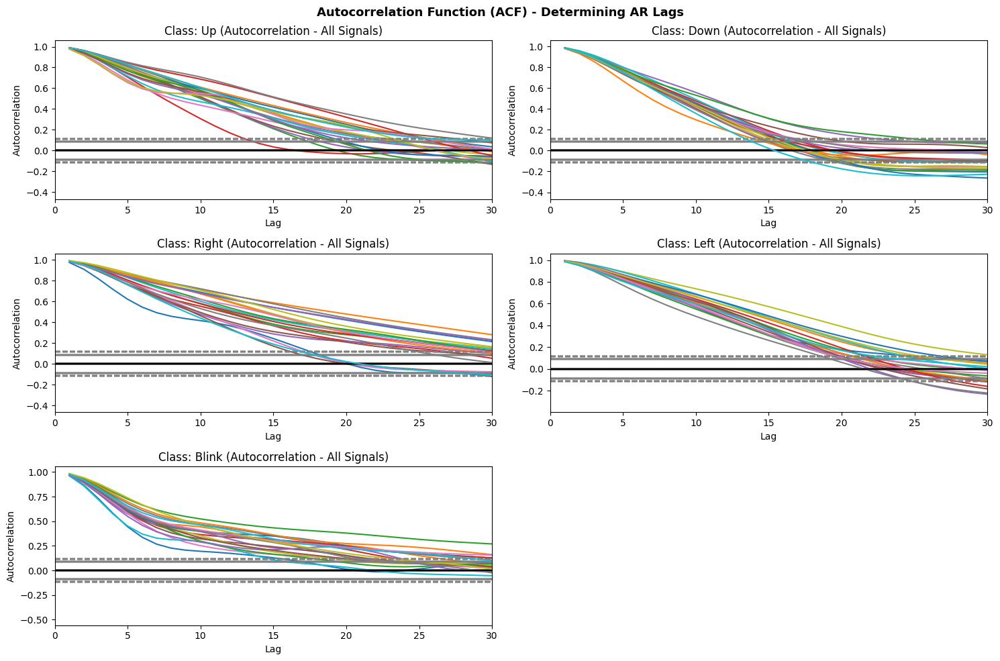

In [ ]:
def extract_morphological_features(signal):
    """
    Extracts time-domain morphological features taught in Lab 3:
    1. Max Peak
    2. Min Peak
    3. Area Under Curve (AUC) - Absolute area to capture total movement
    """
    max_peak = np.max(signal)
    min_peak = np.min(signal)

    # AUC: We take the absolute value of the signal first, otherwise the positive
    # and negative parts of the wave will cancel each other out when integrated.
    auc = np.trapezoid(np.abs(signal))

    return np.array([max_peak, min_peak, auc])

morph_features = {cls: [] for cls in class_mapping.values()}
for cls, signals in normalized.items():
    for s in signals:
        morph_features[cls].append(extract_morphological_features(s))

print("\nStep 4.1: Extracting Morphological Features (AUC, Peaks)...")

# --- STEP 4.2: FEATURE EXTRACTION (AUTOREGRESSION) ---

def plot_acf_all_classes(signals_dict):
    """
    Plot Autocorrelation (ACF) to determine the optimal number of lags for AR.
    As per Lab 3 ML Mastery tutorial, we look for where the line drops into the confidence band.
    """
    plt.figure(figsize=(15, 10))
    for i, (cls, signals) in enumerate(signals_dict.items()):
        ax = plt.subplot(3, 2, i + 1)
        # Plot ACF for ALL signals in the class to see the true average behavior
        for s in signals:
            autocorrelation_plot(s, ax=ax)

        plt.title(f"Class: {cls} (Autocorrelation - All Signals)")
        # Zoom in on the first 30 lags to clearly see where the correlation drops
        plt.xlim(0, 30)

    plt.suptitle("Autocorrelation Function (ACF) - Determining AR Lags", fontsize=13, fontweight='bold')
    plt.tight_layout()

print("\nStep 4.2: Plotting Autocorrelation to determine optimal AR lags...")
plot_acf_all_classes(normalized)

def extract_ar_features(signal, lags=6):
    """
    Extracts Autoregression (AR) coefficients.
    Fits an AR model of specified order (lags) to the signal.
    """
    model = AutoReg(signal, lags=lags, old_names=False)
    model_fitted = model.fit()
    return model_fitted.params

ar_features = {cls: [] for cls in class_mapping.values()}
for cls, signals in normalized.items():
    for s in signals:
        ar_features[cls].append(extract_ar_features(s, lags=6))

print("\nStep 4.2: Extracting Autoregression (AR) Features...")
print(f"  - AR Features: {len(ar_features['Up'][0])} features/signal (Lags=6 + Intercept).")

# --- STEP 4.3: FEATURE EXTRACTION (RAW SAMPLES) ---

def extract_raw_features(signal):
    """
    Raw samples as features. Just returns the 251-dimensional signal.
    """
    return signal

raw_features = {cls: [] for cls in class_mapping.values()}
for cls, signals in normalized.items():
    for s in signals:
        raw_features[cls].append(extract_raw_features(s))

print("\nStep 4.3: Extracting Raw Features...")
print(f"  - Raw Samples: {len(raw_features['Up'][0])} features/signal (Full sequence).")

print("FEATURE EXTRACTION COMPLETE! READY FOR SVM CLASSIFICATION.")

### plots for docx

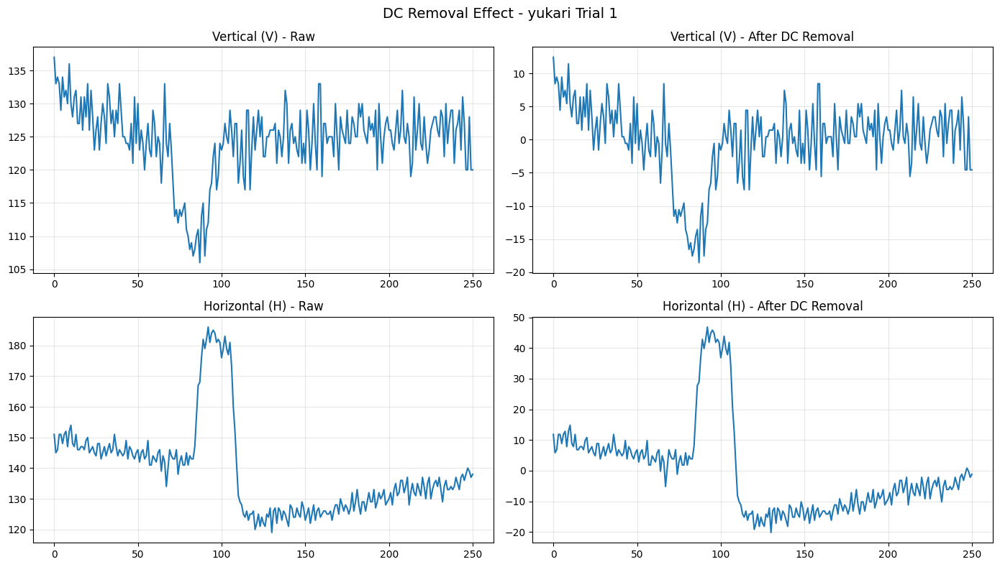

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt

# pick one movement + one trial
movement = classes[0]  # e.g. 'yukari'
trial = 1

v_file = os.path.join(data_path, f"{movement}{trial}v.txt")
h_file = os.path.join(data_path, f"{movement}{trial}h.txt")

# load signals
v = np.loadtxt(v_file)
h = np.loadtxt(h_file)

v_dc = remove_dc(v)
h_dc = remove_dc(h)

# plotting
plt.figure(figsize=(14, 8))

# VERTICAL
plt.subplot(2, 2, 1)
plt.plot(v)
plt.title("Vertical (V) - Raw")
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 2)
plt.plot(v_dc)
plt.title("Vertical (V) - After DC Removal")
plt.grid(True, alpha=0.3)

# HORIZONTAL
plt.subplot(2, 2, 3)
plt.plot(h)
plt.title("Horizontal (H) - Raw")
plt.grid(True, alpha=0.3)

plt.subplot(2, 2, 4)
plt.plot(h_dc)
plt.title("Horizontal (H) - After DC Removal")
plt.grid(True, alpha=0.3)

plt.suptitle(f"DC Removal Effect - {movement} Trial {trial}", fontsize=14)
plt.tight_layout()
plt.show()

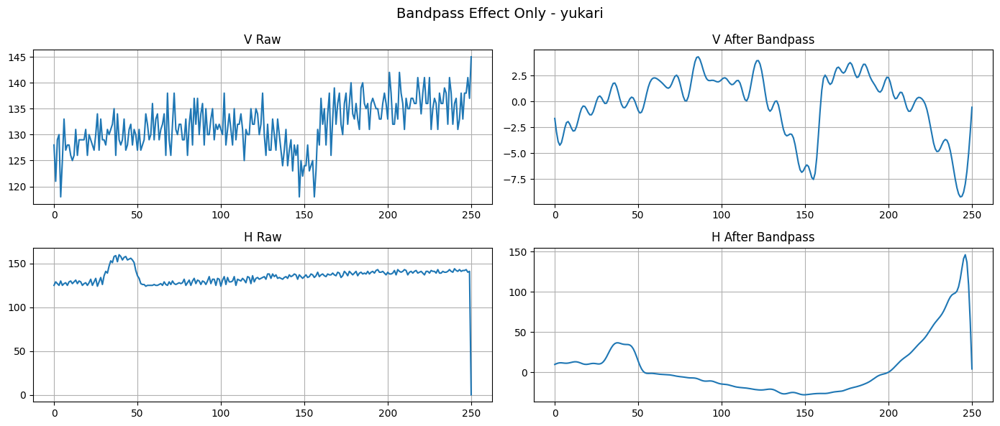

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import os

fs = 176

# --- bandpass only ---
def bandpass(signal, lowcut=0.5, highcut=20.0, fs=176, order=4):
    nyq = 0.5 * fs
    b, a = butter(order, [lowcut/nyq, highcut/nyq], btype='band')
    return filtfilt(b, a, signal)

# pick one movement
movement = classes[0]  # e.g. yukari

v_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("v.txt")])[0]
h_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("h.txt")])[0]

v = np.loadtxt(os.path.join(data_path, v_file))
h = np.loadtxt(os.path.join(data_path, h_file))

# apply bandpass ONLY
v_bp = bandpass(v)
h_bp = bandpass(h)

# --- PLOTS ---
plt.figure(figsize=(14, 6))

# VERTICAL
plt.subplot(2, 2, 1)
plt.plot(v)
plt.title("V Raw")
plt.grid()

plt.subplot(2, 2, 2)
plt.plot(v_bp)
plt.title("V After Bandpass")
plt.grid()

# HORIZONTAL
plt.subplot(2, 2, 3)
plt.plot(h)
plt.title("H Raw")
plt.grid()

plt.subplot(2, 2, 4)
plt.plot(h_bp)
plt.title("H After Bandpass")
plt.grid()

plt.suptitle(f"Bandpass Effect Only - {movement}", fontsize=14)
plt.tight_layout()
plt.show()

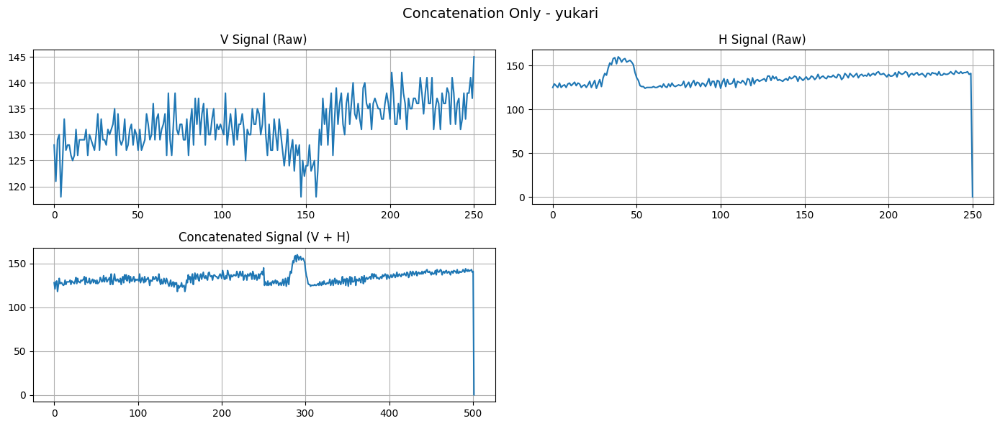

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

# pick one movement
movement = classes[0]  # e.g. yukari

v_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("v.txt")])[0]
h_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("h.txt")])[0]

v = np.loadtxt(os.path.join(data_path, v_file))
h = np.loadtxt(os.path.join(data_path, h_file))

# concatenation ONLY
vh = np.concatenate([v, h])

# --- PLOTS ---
plt.figure(figsize=(14, 6))

# V
plt.subplot(2, 2, 1)
plt.plot(v)
plt.title("V Signal (Raw)")
plt.grid()

# H
plt.subplot(2, 2, 2)
plt.plot(h)
plt.title("H Signal (Raw)")
plt.grid()

# VH concatenated
plt.subplot(2, 2, 3)
plt.plot(vh)
plt.title("Concatenated Signal (V + H)")
plt.grid()

plt.suptitle(f"Concatenation Only - {movement}", fontsize=14)
plt.tight_layout()
plt.show()

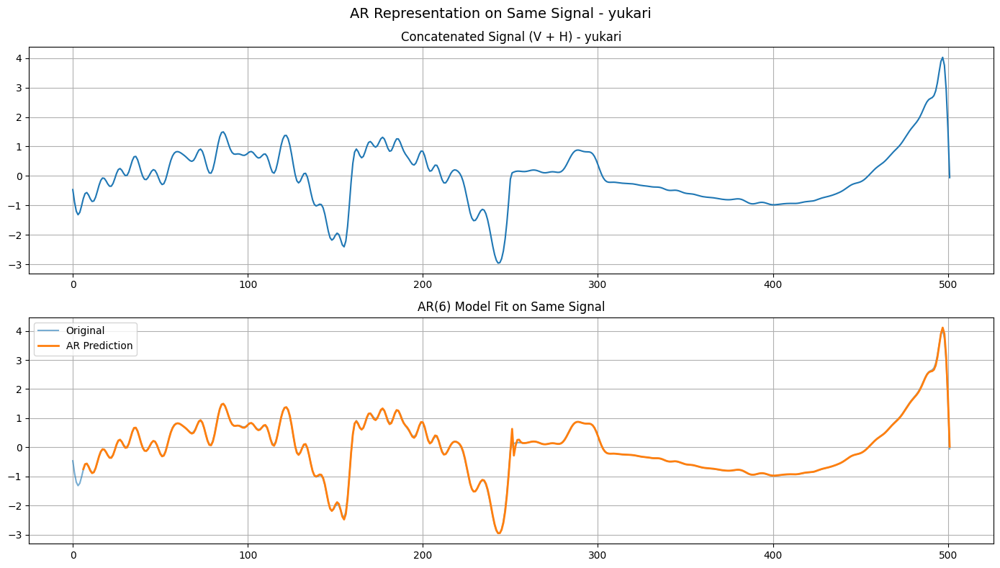

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from statsmodels.tsa.ar_model import AutoReg

# pick one movement
movement = classes[0]  # e.g. yukari

v_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("v.txt")])[0]
h_file = sorted([f for f in os.listdir(data_path) if f.startswith(movement) and f.endswith("h.txt")])[0]

v = np.loadtxt(os.path.join(data_path, v_file))
h = np.loadtxt(os.path.join(data_path, h_file))

# preprocessing (same pipeline)
v_clean = preprocess_signal(v)
h_clean = preprocess_signal(h)

# concatenate (final signal used in ML)
signal = np.concatenate([v_clean, h_clean])

# --- AR MODEL ---
lags = 6
model = AutoReg(signal, lags=lags, old_names=False)
model_fitted = model.fit()

# predicted signal using AR model
ar_pred = model_fitted.predict(start=lags, end=len(signal)-1)

# --- PLOTS ---
plt.figure(figsize=(14, 8))

# original signal
plt.subplot(2, 1, 1)
plt.plot(signal, label="Original Signal")
plt.title(f"Concatenated Signal (V + H) - {movement}")
plt.grid()

# AR reconstruction
plt.subplot(2, 1, 2)
plt.plot(signal, label="Original", alpha=0.6)
plt.plot(np.arange(lags, len(signal)), ar_pred, label="AR Prediction", linewidth=2)
plt.title(f"AR({lags}) Model Fit on Same Signal")
plt.legend()
plt.grid()

plt.suptitle(f"AR Representation on Same Signal - {movement}", fontsize=14)
plt.tight_layout()
plt.show()

# ***Training***

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold, cross_validate
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score
from sklearn.pipeline import make_pipeline

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [ ]:
def build_dataset(feature_blocks: list):
    X_out, y_out = [], []
    for cls, signals in normalized.items():
        label = [k for k, v in reverse_mapping.items() if v == cls][0]
        for i in range(len(signals)):
            parts = []
            for blk in feature_blocks:
                if blk in ('db1', 'db2', 'db4'):
                    parts.append(all_features[blk][cls][i])
                elif blk == 'morph':
                    parts.append(morph_features[cls][i])
                elif blk == 'ar':
                    parts.append(ar_features[cls][i])
            X_out.append(np.concatenate(parts))
            y_out.append(label)
    return np.array(X_out), np.array(y_out)


scoring = {
    'accuracy' : 'accuracy',
    'precision': make_scorer(precision_score, average='macro', zero_division=0),
    'recall'   : make_scorer(recall_score,    average='macro', zero_division=0),
    'f1'       : make_scorer(f1_score,        average='macro', zero_division=0)
}

def run_cv(X, y, kernel, C, gamma='scale'):
    pipe = make_pipeline(
        StandardScaler(),
        SVC(kernel=kernel, C=C, gamma=gamma, class_weight='balanced')
    )
    res = cross_validate(pipe, X, y, cv=cv, scoring=scoring, return_train_score=True)
    return {
        'train_acc' : res['train_accuracy'].mean(),
        'val_acc'   : res['test_accuracy'].mean(),
        'train_f1'  : res['train_f1'].mean(),
        'val_f1'    : res['test_f1'].mean(),
        'val_prec'  : res['test_precision'].mean(),
        'val_rec'   : res['test_recall'].mean(),
        'gap'       : res['train_accuracy'].mean() - res['test_accuracy'].mean()
    }


In [ ]:
COMBOS = {
    'db1'                  : ['db1'],
    'db2'                  : ['db2'],
    'db4'                  : ['db4'],
    'db1+db2'              : ['db1', 'db2'],
    'db1+db4'              : ['db1', 'db4'],
    'db2+db4'              : ['db2', 'db4'],
    'db1+db2+db4'          : ['db1', 'db2', 'db4'],
    'db1+morph'            : ['db1', 'morph'],
    'db2+morph'            : ['db2', 'morph'],
    'db4+morph'            : ['db4', 'morph'],
    'db1+ar'               : ['db1', 'ar'],
    'db2+ar'               : ['db2', 'ar'],
    'db4+ar'               : ['db4', 'ar'],
    'db1+morph+ar'         : ['db1', 'morph', 'ar'],
    'db2+morph+ar'         : ['db2', 'morph', 'ar'],
    'db4+morph+ar'         : ['db4', 'morph', 'ar'],
    'db1+db2+db4+morph'    : ['db1', 'db2', 'db4', 'morph'],
    'db1+db2+db4+ar'       : ['db1', 'db2', 'db4', 'ar'],
    'ALL'                  : ['db1', 'db2', 'db4', 'morph', 'ar'],
}

KERNELS = ['linear', 'rbf', 'sigmoid', 'poly']
C_VALUES = [0.01, 0.1, 0.5, 1, 5]

total = len(COMBOS) * len(KERNELS) * len(C_VALUES)
print(f'Total experiments to run: {total}')

Total experiments to run: 380


In [ ]:
records = []
done = 0

for combo_name, blocks in COMBOS.items():
    X_c, y_c = build_dataset(blocks)
    n_feat = X_c.shape[1]

    for kernel in KERNELS:
        for C in C_VALUES:
            try:
                r = run_cv(X_c, y_c, kernel=kernel, C=C)
                records.append({
                    'Features'  : combo_name,
                    'n_feat'    : n_feat,
                    'Kernel'    : kernel,
                    'C'         : C,
                    'Train_Acc' : round(r['train_acc']*100, 2),
                    'Val_Acc'   : round(r['val_acc']*100,   2),
                    'Val_F1'    : round(r['val_f1']*100,    2),
                    'Val_Prec'  : round(r['val_prec']*100,  2),
                    'Val_Rec'   : round(r['val_rec']*100,   2),
                    'Gap'       : round(r['gap']*100,        2),
                })
            except Exception as e:
                records.append({
                    'Features': combo_name, 'n_feat': n_feat,
                    'Kernel': kernel, 'C': C,
                    'Train_Acc': None, 'Val_Acc': None,
                    'Val_F1': None, 'Val_Prec': None, 'Val_Rec': None, 'Gap': None
                })
            done += 1
            if done % 20 == 0:
                print(f'  {done}/{total} done...')

results_df = pd.DataFrame(records)
print(f'\nGrid complete! {len(results_df)} results collected.')

  20/380 done...
  40/380 done...
  60/380 done...
  80/380 done...
  100/380 done...
  120/380 done...
  140/380 done...
  160/380 done...
  180/380 done...
  200/380 done...
  220/380 done...
  240/380 done...


## Top 20 by Validation Accuracy

In [ ]:
top20 = (
    results_df
    .dropna(subset=['Val_Acc'])
    .sort_values('Val_Acc', ascending=False)
    .head(20)
    .reset_index(drop=True)
)
top20.index += 1
print('=== TOP 20 CONFIGURATIONS ===')
display(top20)

=== TOP 20 CONFIGURATIONS ===


,Features,n_feat,Kernel,C,Train_Acc,Val_Acc,Val_F1,Val_Prec,Val_Rec,Gap
1,db1+db2+db4+morph,39,linear,0.10,93.25,78.0,75.74,76.07,78.0,15.25
2,db2+morph+ar,22,linear,0.10,90.25,78.0,76.50,79.09,78.0,12.25
3,db2+morph+ar,22,linear,0.50,96.75,77.0,75.86,78.00,77.0,19.75
4,db2+morph,15,rbf,5.00,99.25,77.0,75.39,77.95,77.0,22.25
5,db2+morph,15,linear,1.00,94.50,77.0,75.53,78.55,77.0,17.50
6,db1+morph,15,linear,0.50,91.50,76.0,75.66,79.09,76.0,15.50
7,db2+morph+ar,22,linear,5.00,100.00,76.0,75.02,78.87,76.0,24.00
8,db1+db2+db4+morph,39,rbf,5.00,100.00,76.0,72.29,73.22,76.0,24.00
9,ALL,46,linear,0.50,100.00,76.0,73.87,75.38,76.0,24.00
10,ALL,46,linear,0.10,95.00,76.0,74.61,75.60,76.0,19.00


## Top 20 small Gap

In [ ]:
top20_small_gap = (
    results_df
    .dropna(subset=['Gap'])
    .sort_values('Gap', ascending=True)
    .head(20)
    .reset_index(drop=True)
)

top20_small_gap.index += 1

print('=== TOP 20 CONFIGURATIONS WITH SMALLEST GAP ===')
display(top20_small_gap)

=== TOP 20 CONFIGURATIONS WITH SMALLEST GAP ===


,Features,n_feat,Kernel,C,Train_Acc,Val_Acc,Val_F1,Val_Prec,Val_Rec,Gap
1,db1+morph,15,sigmoid,0.01,67.00,67.0,65.60,70.49,67.0,-0.00
2,db1+morph,15,sigmoid,0.10,67.25,67.0,65.60,70.49,67.0,0.25
3,db1+morph,15,sigmoid,0.50,73.75,73.0,70.89,73.63,73.0,0.75
4,db2+db4,24,sigmoid,0.50,64.25,63.0,58.59,60.87,63.0,1.25
5,db1+morph,15,sigmoid,1.00,74.25,73.0,71.99,75.09,73.0,1.25
6,db1+db4,24,sigmoid,0.50,65.25,64.0,60.11,63.56,64.0,1.25
7,db1,12,sigmoid,5.00,43.25,42.0,41.29,44.48,42.0,1.25
8,db1+db2+db4+morph,39,sigmoid,0.10,69.50,68.0,65.23,70.82,68.0,1.50
9,db2+morph,15,linear,0.01,76.00,74.0,71.62,74.09,74.0,2.00
10,db1+morph,15,sigmoid,5.00,70.00,68.0,67.89,75.51,68.0,2.00


## Per-Feature-Set Summary (best val acc across all kernels & C)

In [ ]:
best_per_combo = (
    results_df
    .dropna(subset=['Val_Acc'])
    .sort_values('Val_Acc', ascending=False)
    .groupby('Features', sort=False)
    .first()
    .reset_index()
    [['Features','n_feat','Kernel','C','Train_Acc','Val_Acc','Val_F1','Gap']]
    .sort_values('Val_Acc', ascending=False)
    .reset_index(drop=True)
)
best_per_combo.index += 1
print('=== BEST CONFIG PER FEATURE SET ===')
display(best_per_combo)

=== BEST CONFIG PER FEATURE SET ===


,Features,n_feat,Kernel,C,Train_Acc,Val_Acc,Val_F1,Gap
1,db1+db2+db4+morph,39,linear,0.1,93.25,78.0,75.74,15.25
2,db2+morph+ar,22,linear,0.1,90.25,78.0,76.50,12.25
3,db2+morph,15,rbf,5.0,99.25,77.0,75.39,22.25
4,db1+morph,15,linear,0.5,91.50,76.0,75.66,15.50
5,ALL,46,linear,0.5,100.00,76.0,73.87,24.00
6,db4+morph,15,linear,0.5,88.50,76.0,74.66,12.50
7,db4+morph+ar,22,linear,0.5,94.25,73.0,71.82,21.25
8,db1+morph+ar,22,linear,0.5,93.75,73.0,72.38,20.75
9,db1+db2+db4,36,linear,0.1,86.50,73.0,69.76,13.50
10,db1+db2,24,linear,0.1,81.50,73.0,70.25,8.50


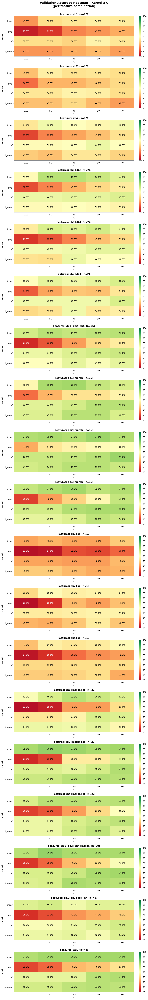

In [ ]:
n_combos = len(COMBOS)
fig, axes = plt.subplots(n_combos, 1, figsize=(10, 3.5 * n_combos))

for ax, (combo_name, _) in zip(axes, COMBOS.items()):
    sub = results_df[results_df['Features'] == combo_name].dropna(subset=['Val_Acc'])
    pivot = sub.pivot(index='Kernel', columns='C', values='Val_Acc')
    im = ax.imshow(pivot.values, aspect='auto', cmap='RdYlGn', vmin=20, vmax=100)

    ax.set_xticks(range(len(pivot.columns)))
    ax.set_xticklabels(pivot.columns)
    ax.set_yticks(range(len(pivot.index)))
    ax.set_yticklabels(pivot.index)
    ax.set_title(f'Features: {combo_name}  (n={sub.iloc[0]["n_feat"]})', fontsize=11, fontweight='bold')
    ax.set_xlabel('C')
    ax.set_ylabel('Kernel')

    for r in range(pivot.shape[0]):
        for c in range(pivot.shape[1]):
            val = pivot.values[r, c]
            ax.text(c, r, f'{val:.1f}%', ha='center', va='center', fontsize=9,
                    color='black' if 30 < val < 80 else 'white')

    plt.colorbar(im, ax=ax, fraction=0.02, pad=0.04)

plt.suptitle('Validation Accuracy Heatmap – Kernel x C\n(per feature combination)',
             fontsize=14, fontweight='bold', y=1.001)
plt.tight_layout()
plt.show()

## Bar Chart – Best Val Accuracy per Feature Set

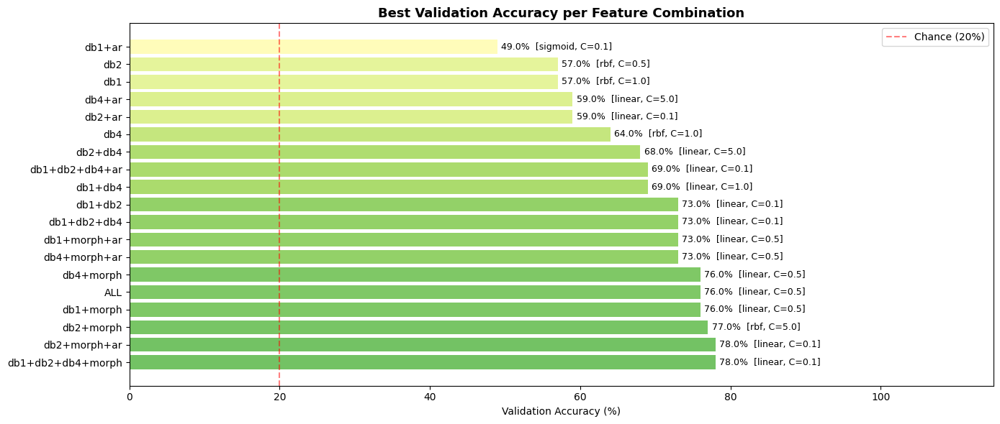

In [ ]:
fig, ax = plt.subplots(figsize=(14, 6))
colors = plt.cm.RdYlGn(best_per_combo['Val_Acc'] / 100)

bars = ax.barh(best_per_combo['Features'], best_per_combo['Val_Acc'], color=colors)

for bar, (_, row) in zip(bars, best_per_combo.iterrows()):
    ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
            f"{row['Val_Acc']:.1f}%  [{row['Kernel']}, C={row['C']}]",
            va='center', fontsize=9)

ax.axvline(x=20, color='red', linestyle='--', alpha=0.5, label='Chance (20%)')
ax.set_xlabel('Validation Accuracy (%)')
ax.set_title('Best Validation Accuracy per Feature Combination', fontsize=13, fontweight='bold')
ax.legend()
ax.set_xlim(0, 115)
plt.tight_layout()
plt.show()

## Chart For Best Gaps

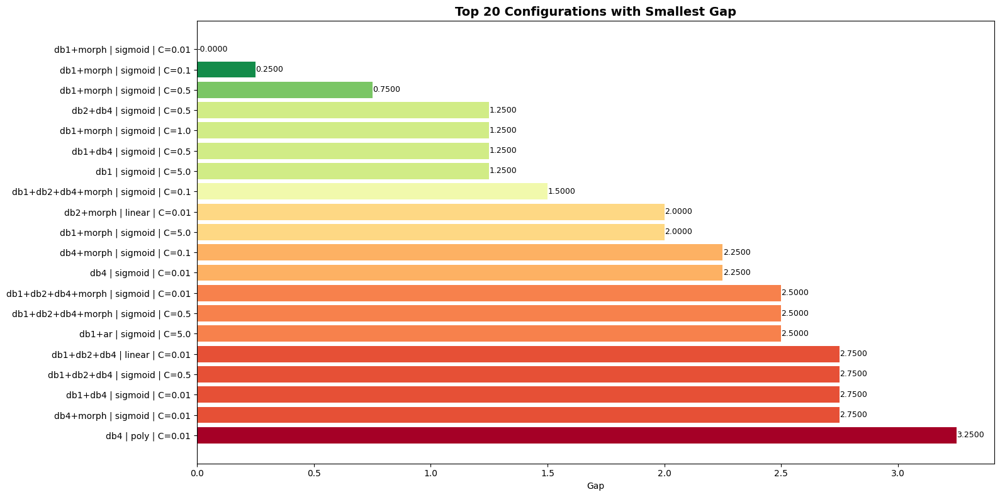

In [ ]:
top20_gap = (
    results_df
    .dropna(subset=['Gap'])
    .sort_values('Gap', ascending=True)
    .head(20)
    .reset_index(drop=True)
)

fig, ax = plt.subplots(figsize=(16, 8))

colors = plt.cm.RdYlGn_r(top20_gap['Gap'] / top20_gap['Gap'].max())

labels = [
    f"{row['Features']} | {row['Kernel']} | C={row['C']}"
    for _, row in top20_gap.iterrows()
]

bars = ax.barh(labels, top20_gap['Gap'], color=colors)

for bar, (_, row) in zip(bars, top20_gap.iterrows()):
    ax.text(
        bar.get_width() + 0.001,
        bar.get_y() + bar.get_height() / 2,
        f"{row['Gap']:.4f}",
        va='center',
        fontsize=9
    )

ax.invert_yaxis()

ax.set_xlabel('Gap')
ax.set_title('Top 20 Configurations with Smallest Gap', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

## Detailed Report – Per-Feature-Set & Per-Kernel breakdown

In [ ]:
for combo_name in COMBOS:
    sub = results_df[results_df['Features'] == combo_name].dropna(subset=['Val_Acc'])
    best = sub.loc[sub['Val_Acc'].idxmax()]

    print(f"\n{'='*60}")
    print(f"  Feature Set : {combo_name}  (dim={int(best['n_feat'])})")
    print(f"  Best Config : kernel={best['Kernel']}  C={best['C']}")
    print(f"  Train Acc   : {best['Train_Acc']:.2f}%")
    print(f"  Val   Acc   : {best['Val_Acc']:.2f}%    F1={best['Val_F1']:.2f}%")
    print(f"  Gap         : {best['Gap']:.2f}%")
    print()

    # Per-kernel best
    pk = (
        sub.sort_values('Val_Acc', ascending=False)
        .groupby('Kernel').first()
        .reset_index()
        [['Kernel','C','Train_Acc','Val_Acc','Val_F1','Gap']]
        .sort_values('Val_Acc', ascending=False)
    )
    for _, row in pk.iterrows():
        print(f"    {row['Kernel']:<10} C={row['C']:<6}  "
              f"Train={row['Train_Acc']:.1f}%  Val={row['Val_Acc']:.1f}%  "
              f"F1={row['Val_F1']:.1f}%  Gap={row['Gap']:.1f}%")


  Feature Set : db1  (dim=12)
  Best Config : kernel=rbf  C=1.0
  Train Acc   : 74.50%
  Val   Acc   : 57.00%    F1=54.41%
  Gap         : 17.50%

    rbf        C=1.0     Train=74.5%  Val=57.0%  F1=54.4%  Gap=17.5%
    linear     C=1.0     Train=72.8%  Val=56.0%  F1=53.2%  Gap=16.8%
    sigmoid    C=1.0     Train=50.0%  Val=46.0%  F1=44.9%  Gap=4.0%
    poly       C=5.0     Train=81.0%  Val=44.0%  F1=42.0%  Gap=37.0%

  Feature Set : db2  (dim=12)
  Best Config : kernel=rbf  C=0.5
  Train Acc   : 73.25%
  Val   Acc   : 57.00%    F1=53.12%
  Gap         : 16.25%

    rbf        C=0.5     Train=73.2%  Val=57.0%  F1=53.1%  Gap=16.2%
    linear     C=0.1     Train=67.5%  Val=56.0%  F1=53.7%  Gap=11.5%
    poly       C=5.0     Train=81.8%  Val=51.0%  F1=50.4%  Gap=30.8%
    sigmoid    C=0.5     Train=56.0%  Val=51.0%  F1=46.3%  Gap=5.0%

  Feature Set : db4  (dim=12)
  Best Config : kernel=rbf  C=1.0
  Train Acc   : 81.00%
  Val   Acc   : 64.00%    F1=60.73%
  Gap         : 17.00%

    rb

## Save Results to CSV

In [ ]:
results_df.to_csv('/content/svm_grid_results.csv', index=False)
best_per_combo.to_csv('/content/svm_best_per_combo.csv', index=False)
print('Saved: svm_grid_results.csv  and  svm_best_per_combo.csv')

Saved: svm_grid_results.csv  and  svm_best_per_combo.csv
